Code used to analyze the spectral signal of NERC GMD GIC data


## Dependencies

In [2]:
import numpy as np
import pandas as pd
import glob
import os

import datetime
from datetime import datetime, timedelta

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from sunpy.net import Fido
from sunpy.net import attrs as a
from sunpy.timeseries import TimeSeries

import scipy.signal

import pywt


from pyextremes import plot_mean_residual_life, EVA

import plotly.express as px
import plotly




## Functions

In [3]:
def clean_GIC_data(df,df_sensor_locations):
    '''
    - delete repeated time points
    - delete station if all time points are empty
    - Find how many of the measurements differ from one time step to the next and delete station if on average measurements differ less than once in 5 minutes
    - remove repeat stations from files
    
    '''
    
    # Delete repeated time points
    df = df.drop(df[df.duplicated(subset='datetimes', keep='first')].index)
    
    cols_to_drop = []
    for id_loop in df.columns.to_list():
        
        if (id_loop == 'datetimes'):
            continue
            
        # Delete station if most time points are empty
        if ( (df[id_loop].isna().mean() * 100) > 80.):
            cols_to_drop.append(id_loop)
            continue
            
#     print('cols_to_drop after first filter = {}'.format(cols_to_drop))

    # remove repeat stations from files
    duplicate_lats = df_sensor_locations.duplicated(subset=' Latitude',keep='first')
    duplicate_lons = df_sensor_locations.duplicated(subset=' Longitude',keep='first')
    duplicate_locations = df_sensor_locations['Device ID'].values[np.where( (duplicate_lats.values==True) & (duplicate_lons.values==True) )]

    for d in duplicate_locations:
        try:
            #print(df[str(d)])
            cols_to_drop.append(str(d))
        except:
            print('no df entry for devide ID {}'.format(str(d)))
#         # Check I wrote to guarantee the code above removes duplicate stations (keeping only one of the same lat-long)
#         for a in df_sensor_locations['Device ID'].values[np.where( (duplicate_lats.values==True) & (duplicate_lons.values==True) )]:
#             idx = df_sensor_locations.index[df_sensor_locations['Device ID'] == a].tolist()
#             print('the index of the duplicated lat and lon = {}'.format(a))
#             print(' \t --> {}'.format( df_sensor_locations[idx[0]-2:idx[0]+3] ))

#     print('cols_to_drop after second filter = {}'.format(cols_to_drop))

    # Find how many of the measurements differ from one time step to the next and delete station if measurements repeat for more than 60% of the data 
    for device_id in df.columns.to_list():
        if device_id == 'datetimes':
            continue
        count_zeros = np.count_nonzero(np.diff(df[device_id].values) == 0)
        tmp_len = len(np.argwhere(np.isfinite(df[device_id].values)==True))
        tmp = (count_zeros/tmp_len)*100
#             print('percentage of repeated values = {}'.format( tmp  ))
        if tmp > 60.:
            cols_to_drop.append(device_id)

#     print('cols_to_drop after third filter = {}'.format(cols_to_drop))


    cols_to_drop = list(set(cols_to_drop))
#     print('Total number of columns to drop = {}'.format(len(cols_to_drop)))
#     # some stations were removed in the process of creating the integrated data files, so need to check if all columns to remove exist
    cols_to_drop_final = []
    for c in cols_to_drop:
        if any( str(c) in x for x in df.columns.to_list()):
            cols_to_drop_final.append(str(c))
#         else:
#             print('{} is NOT in the columns list'.format(c))

    df = df.drop(cols_to_drop_final,axis=1)
    
    return df, cols_to_drop_final

def visualize_dataframe_columns(df):
    fig, axs = plt.subplots(len(df.columns), 1, figsize=(6, 1.5*len(df.columns)))
    
    for i, col in enumerate(df.columns):
        axs[i].plot(df[col])
        axs[i].set_ylabel(col, rotation=0, labelpad=20, fontsize=10)
        axs[i].set_yticklabels([])
        axs[i].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    
    plt.tight_layout()
    plt.show()
    
def visualize_dataframe_singlecolumn(df,col_name):
    fig, axs = plt.subplots(1, 1, figsize=(10,8))
    
    axs.plot(df['datetimes'],df[col_name])
    axs.set_ylabel(col_name, rotation=0, labelpad=20, fontsize=10)
#     axs[i].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    
    plt.tight_layout()
    plt.show()


In [4]:
def get_sw_one_minute(start_datetime,end_datetime):

    '''
    input datetimes must be in format '%Y/%m/%d %H:%M:%S'
    '''
    

#     sunpy_format = '%Y/%m/%d %H:%M'

#     trange = a.Time(start_datetime.strftime(sunpy_format), end_datetime.strftime(sunpy_format))
    trange = a.Time(start_datetime,end_datetime)
    dataset = a.cdaweb.Dataset('OMNI_HRO2_1MIN')
    result = Fido.search(trange, dataset)

    downloaded_files = Fido.fetch(result[0])
    print(downloaded_files)
    
    sw_data = TimeSeries(downloaded_files, concatenate=True)
    df_SW = sw_data.to_dataframe()
    df_SW['datetimes'] = df_SW.index
    strings_to_match = ['AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']
    filtered_columns = df_SW.filter(items=strings_to_match, axis=1)
    df_SW_filtered = df_SW.drop(columns=df_SW.columns.difference(strings_to_match))

    print(df_SW_filtered.columns)
    datetimes_SW = [t.strftime('%Y/%m/%d %H:%M:%S') for t in df_SW_filtered.index]
    df_SW_filtered['datetimes'] = datetimes_SW



    return df_SW_filtered
    
    

## Read in the integrated data

In [5]:
integrated_data_directory = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/'
files = glob.glob( os.path.join(integrated_data_directory,'*.csv') )
files

['/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150919.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150317.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20151220.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20130531.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20210512.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20131002.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20170927.csv',
 '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150622.csv',
 '/Users/ryanmc/Documents/Conferences/Ja

## Calculate and visualize the power spectrum of the GICs for each event




----------------------------
working on event: event_20150317


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150301_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')


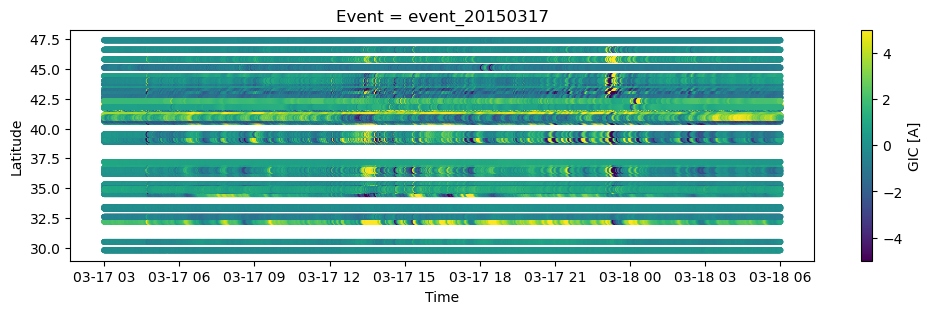

In [15]:


df_total = pd.DataFrame()

for f in files[1:2]:
    df = pd.read_csv(f,index_col=False)
    df = df.drop(columns='Unnamed: 0')
    
    # read in the lat-long values for the sensors in this event
    print('\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
#     print('\t--->{}'.format(f))
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')

#     print('\t--->{}'.format(file_sensor_locations))
    df_sensor_locations = pd.read_csv(file_sensor_locations)
    
    # Drop unwanted columns, but save IMF and AE index columns
#     df_SW = df(['datetimes','AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']).copy()
    cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
    df.columns.to_list()[cols_to_drop_loc:]
    df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)
    
    
    # Clean the data
    df, cols_to_drop_final = clean_GIC_data(df,df_sensor_locations)
    df = df.set_index(['datetimes'])
    df.index = pd.to_datetime(df.index)
    
    # Get the SW data
    df_SW_oneminute = get_sw_one_minute(df.index.values[0],df.index.values[-1])

    
    # Plot the data
    plt.figure(figsize=(12,3))
    for i,sensor in enumerate(df):
        location_idx = np.where(int(sensor)==df_sensor_locations['Device ID'].values )[0][0]
        sc = plt.scatter(df.index, 
                         np.tile(df_sensor_locations[' Latitude'].values[location_idx],len(df.index)), 
                         c=df[sensor].values, 
                         cmap='viridis', 
                         s=10,
                         vmin=-5, 
                         vmax=5)
    plt.colorbar(sc, label='GIC [A]')
    plt.xlabel('Time')
    plt.ylabel('Latitude')
    plt.title('Event = ' + str(f[97:-4]))
    plt.show()
    
#     df_total = pd.concat([df_total, df], axis=1)


(16511.0, 16514.0)

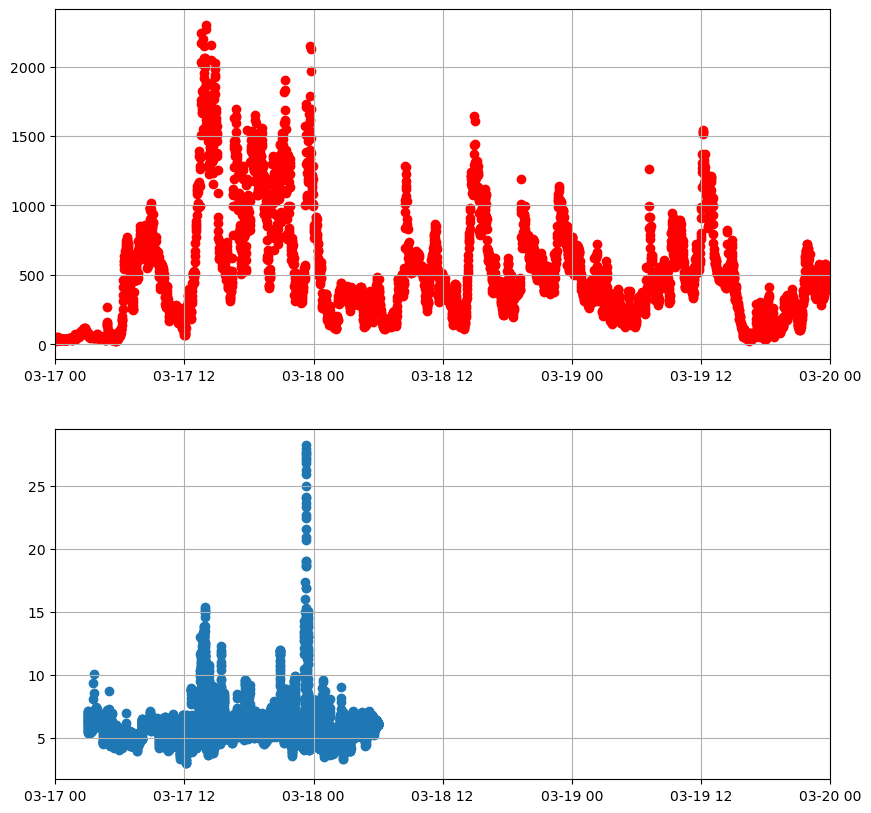

In [22]:
plt.figure(figsize=(10,10))
gs = gridspec.GridSpec(2, 1, figure=fig)

ax0 = plt.subplot(gs[0, 0])
ax0.scatter(df_SW_oneminute.index,df_SW_oneminute['AE_INDEX'],c='r')
ax0.grid(True)
ax0.set_xlim(df.index[0],df.index[-1])

ax1 = plt.subplot(gs[1, 0])
ax1.scatter(df.index,df.max(axis=1).values)
ax1.grid(True)
ax1.set_xlim(df.index[0],df.index[-1])



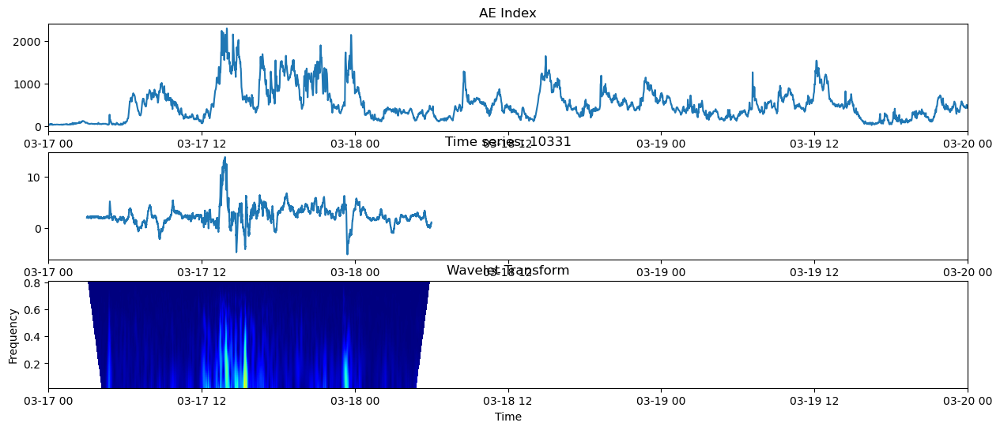

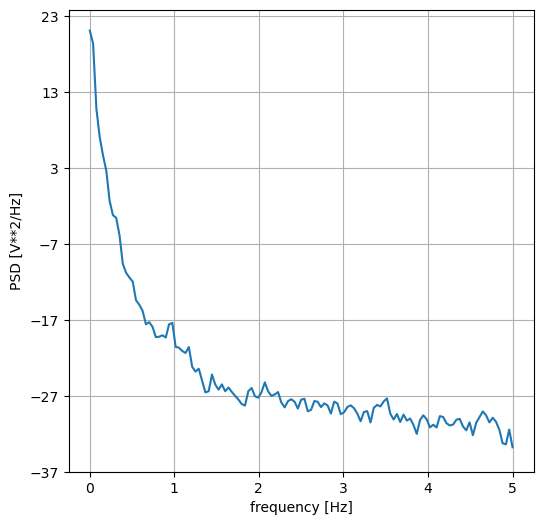

In [103]:

# 10208 	10183 	10197 	10196 	10193 	10187 	10218 	10191 	10184
sensor_val = '10331'#'10218'#'10331'#'10085'#



fig = plt.figure(figsize=(15, 6))
gs = gridspec.GridSpec(3, 1, figure=fig)
# Create plots in the grid
ax1 = plt.subplot(gs[0, 0])  # First row
ax2 = plt.subplot(gs[1, 0])  # Second row
ax3 = plt.subplot(gs[2, 0])  # Third row
# ax4 = plt.subplot(gs[3, 0])  # Fourth row

ax1.plot(df_SW_oneminute.index,df_SW_oneminute['AE_INDEX'])
# ax1.set_xlim([df_SW_oneminute.index[0],df_SW_oneminute.index[-1]])
ax1.set_xlim([df.index[0],df.index[-1]])
ax1.set_title('AE Index')

ax2.plot(df.index,df[sensor_val].values)
ax2.set_xlim([df.index[0],df.index[-1]])
ax2.set_title('Time series: ' + sensor_val)


# Specify wavelet parameters
wavelet_name = 'morl'
scales = np.arange(1, 50)


series = df[sensor_val].values
coefficients, frequencies = pywt.cwt(series, scales, wavelet_name)

ax = ax3.imshow(np.abs(coefficients), extent=[df.index.values[0], df.index.values[-1], frequencies[-1], frequencies[0]], aspect='auto', cmap='jet')
# fig.colorbar(a,cax=ax3,label='Magnitude',orientation='horizontal')
ax3.set_xlabel('Time')
ax3.set_ylabel('Frequency')
ax3.set_title('Wavelet Transform')


plt.show()



fig2 = plt.figure(figsize=(6, 6))
fs = 10.0 # 10 Hz sampling frequency

signal = df[sensor_val].values
signal = signal[~np.isnan(signal)]

# (f, S) = scipy.signal.periodogram(signal, fs, scaling='density')
# plt.semilogy(f, S)
# # plt.ylim([1e-7, 1e2])
# # plt.xlim([0,100])
# plt.xlabel('frequency [Hz]')
# plt.ylabel('PSD [V**2/Hz]')
# plt.grid(True)
# plt.title('PSD')

(S, f) = plt.psd(signal, Fs=fs)

# plt.semilogy(f, S)
# plt.xlim([0, 100])
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.show()

plt.show()


## Extreme value analyses


### mean excess


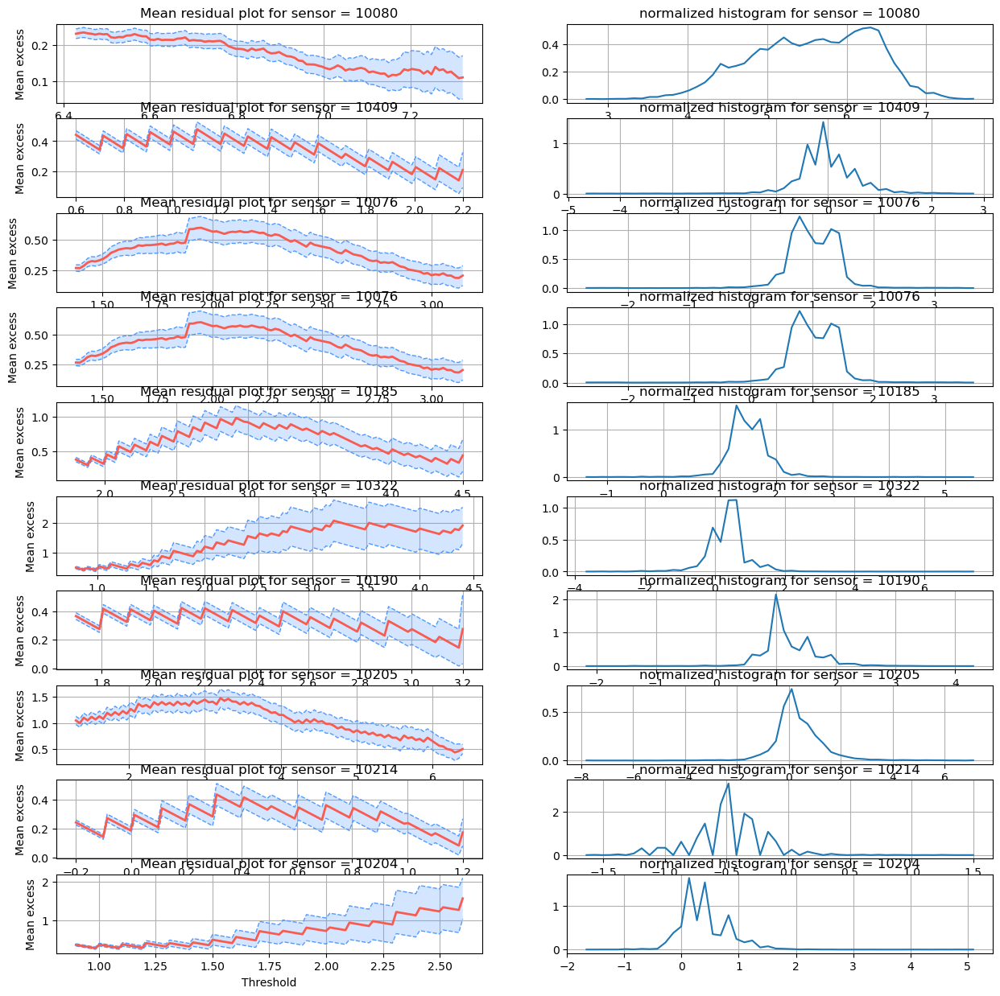

In [122]:


fig = plt.figure(figsize=(15,15))
gs = gridspec.GridSpec(10, 2, figure=fig)



for s in range(0,10):
    sensor_val_loop = np.random.choice(df.columns.to_list())

    ax1 = plt.subplot(gs[s, 0])
    plot_mean_residual_life(df[sensor_val_loop][~np.isnan(df[sensor_val_loop])],ax=ax1)
    ax1.set_title('Mean residual plot for sensor = ' + sensor_val_loop)
    ax1.grid(True)
    
    ax2 = plt.subplot(gs[s, 1])
    counts, bin_edges = np.histogram(df[sensor_val_loop][~np.isnan(df[sensor_val_loop])], 
                                     bins=50,
                                     density=True)    
    plt.plot(bin_edges[1:],counts)    
    ax2.set_title('normalized histogram for sensor = ' + sensor_val_loop)
    ax2.grid(True)






In [131]:
max_values = df.max(axis=1)

# plt.figure()
# plt.scatter(df.index,max_values)
# plt.grid(True)
# plt.xlabel('Maximum GIC')
# plt.ylabel('Datetime')


import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.subplots import make_subplots


fig = make_subplots(rows=2, cols=1,shared_xaxes=True,)

fig.add_trace(go.Scatter(
                    x=df_SW_oneminute.index,
                    y=df_SW_oneminute['AE_INDEX'].values,
                    mode='markers',
                    name='AE Index'
                  ), 
              row=1, col=1)
,

fig.add_trace(go.Scatter(
                    x=df.index,
                    y=max_values,
                    mode='markers',
                    name='Max GIC'
                  ), 
              row=2, col=1)

fig.update_xaxes(range=[df.index[0], df.index[-1]])

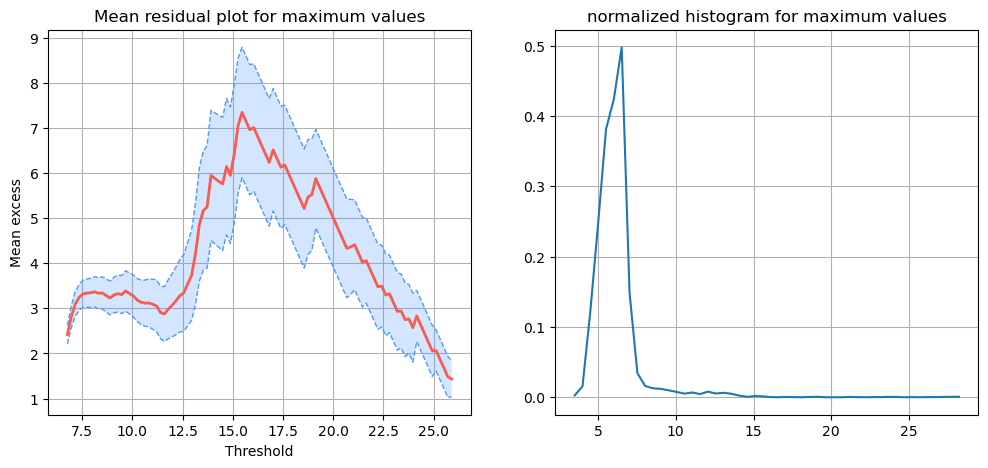

In [134]:
# Plot the mean excess plot using the event maxima
fig = plt.figure(figsize=(12,5))
gs = gridspec.GridSpec(1, 2, figure=fig)

ax1 = plt.subplot(gs[0, 0])
plot_mean_residual_life(max_values[~np.isnan(max_values)],ax=ax1)
ax1.set_title('Mean residual plot for maximum values')
ax1.grid(True)

ax2 = plt.subplot(gs[0, 1])
counts, bin_edges = np.histogram(max_values[~np.isnan(max_values)], 
                                 bins=50,
                                 density=True)    
plt.plot(bin_edges[1:],counts)    
ax2.set_title('normalized histogram for maximum values')
ax2.grid(True)

In [148]:
df

,datetimes,10107,10305,10273,10306,10075,10077,10261,10301,10207,...,10318,10085,10078,10252,10079,10257,10322,10309,10321,10080
0,2015-09-11 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-09-11 00:00:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-09-11 00:00:20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-09-11 00:00:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2015-09-11 00:00:40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19847,2015-09-12 23:59:20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19848,2015-09-12 23:59:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19849,2015-09-12 23:59:40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19850,2015-09-12 23:59:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN






----------------------------
working on event: event_20150919
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150919.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150901_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10425']
cols_to_drop after second filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436', '10200', '10412', '10406', '10361', '10407', '10413', '10405', '10411', '10388', '10410', '10404', '10362', '10400', '10399', '10401', '10402', '10364', '10276', '10076', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20150317
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150317.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150301_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10540', '10219', '10425', '10477']
cols_to_drop after second filter = ['10540', '10219', '10425', '10477', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10388', '10433', '10436']
cols_to_drop after third filter = ['10540', '10219', '10425', '10477', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10388', '10433', '10436', '10435', '10434', '10436', '10379', '10437', '10433', '10432', '10222', '10083', '10254', '10305', '10306', '10399', '10400', '10401', '10364', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20151220
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20151220.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20151201_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10120', '10119', '10425', '10263', '10116', '10112']
cols_to_drop after second filter = ['10120', '10119', '10425', '10263', '10116', '10112', '10224', '10300', '10320', '10081', '10085', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10120', '10119', '10425', '10263', '10116', '10112', '10224', '10300', '10320', '10081', '10085', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10387', '10388', '10433', '10436', '10083', '10254', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20130531
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20130531.csv


Files Downloaded:   0%|          | 0/2 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20130501_v01.cdf', '/Users/ryanmc/sunpy/data/omni_hro2_1min_20130601_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10555', '10486', '10508', '10562']
cols_to_drop after second filter = ['10555', '10486', '10508', '10562', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10379', '10380', '10381', '10384', '10433', '10436']
cols_to_drop after third filter = ['10555', '10486', '10508', '10562', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10379', '10380', '10381', '10384', '10433', '10436', '10431', '10381', '10222', '10434', '10435', '10409', '10437', '10436', '10322', '10318', '10075', '10077', '10406', '10412', '10404', '10362', '10410', '10411', '10405', '10363', '10401', '10400', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20210512
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20210512.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20210501_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10103', '10117', '10116', '10102', '10115', '10111', '10112', '10099', '10113', '10121', '10120', '10119']
cols_to_drop after second filter = ['10103', '10117', '10116', '10102', '10115', '10111', '10112', '10099', '10113', '10121', '10120', '10119', '10072', '10073', '10098', '10300', '10304', '10306', '10311', '10312', '10314', '10315', '10317', '10319', '10320', '10338', '10340', '10342', '10344', '10345', '10347', '10350', '10351', '10352', '10356', '10078', '10080', '10081', '10082', '10084', '10085', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10293', '10295', '10333', '10334', '10335', '10346', '10088', '10192', '10209', '10249']
cols_to_drop after third filter = ['10103', '10117', '10116', '10102', '10115', '10111', '10112', '10099', '10113', '10121', '10120', '10119', '10072', '10073', '10098', '10300', '10304', '10306', '10311', '10312', '10314', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20131002
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20131002.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20131001_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10115', '10116', '10112', '10323', '10121', '10119', '10425']
cols_to_drop after second filter = ['10115', '10116', '10112', '10323', '10121', '10119', '10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10384', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10115', '10116', '10112', '10323', '10121', '10119', '10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10384', '10386', '10388', '10433', '10436', '10406', '10361', '10405', '10362', '10404', '10399', '10400', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20170927
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20170927.csv


Files Downloaded:   0%|          | 0/2 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20170901_v01.cdf', '/Users/ryanmc/sunpy/data/omni_hro2_1min_20171001_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10120', '10119', '10427', '10425', '10237', '10428', '10115', '10117', '10116']
cols_to_drop after second filter = ['10120', '10119', '10427', '10425', '10237', '10428', '10115', '10117', '10116', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10334', '10335', '10346', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10421', '10220', '10286', '10290', '10378', '10379', '10380', '10381', '10383', '10384', '10385', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10120', '10119', '10427', '10425', '10237', '10428', '10115', '10117', '10116', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20150622
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150622.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150601_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10425']
cols_to_drop after second filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10384', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10378', '10379', '10380', '10382', '10383', '10384', '10387', '10388', '10433', '10436', '10401', '10400', '10399', '10364', '10402', '10407', '10361', '10200', '10360', '10362', '10203', '10363', '10405', '10299', '10076', '10300', '10325', '10324', '10083', '10385', '10435', '10437', '10379', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20170527
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20170527.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20170501_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10348', '10428', '10114', '10116', '10117', '10113', '10338', '10111', '10336', '10120', '10335', '10119', '10427', '10341', '10236', '10342', '10420', '10232', '10231']
cols_to_drop after second filter = ['10348', '10428', '10114', '10116', '10117', '10113', '10338', '10111', '10336', '10120', '10335', '10119', '10427', '10341', '10236', '10342', '10420', '10232', '10231', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10081', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10335', '10346', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10421', '10220', '10290', '10378', '10380', '10381', '10383', '10384', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10348', '10428', '10114', '10116', '10117', '10113', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20180825
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20180825.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20180801_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10095', '10485', '10491', '10452', '10484', '10241', '10096', '10243', '10492', '10120', '10530', '10242', '10518', '10246', '10468', '10119', '10509', '10245', '10480', '10457', '10244', '10551', '10425', '10550', '10578', '10552', '10426', '10427', '10568', '10541', '10567', '10576', '10563', '10575', '10428', '10560', '10574', '10117', '10116', '10102', '10466', '10504', '10470', '10114', '10115', '10465', '10111', '10099', '10489', '10113', '10488']
cols_to_drop after second filter = ['10095', '10485', '10491', '10452', '10484', '10241', '10096', '10243', '10492', '10120', '10530', '10242', '10518', '10246', '10468', '10119', '10509', '10245', '10480', '10457', '10244', '10551', '10425', '10550', '10578', '10552', '10426', '10427', '10568', '10541', '10567', '10576', '10563', '10575', '10428', '10560', '10574', '10117', '10116', '10102', '10466', '10504', '10470', '10114', '10115',

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20170907
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20170907.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20170901_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10427', '10425', '10084']
cols_to_drop after second filter = ['10427', '10425', '10084', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', '10084', '10085', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10334', '10335', '10346', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10421', '10220', '10290', '10378', '10379', '10380', '10381', '10383', '10384', '10385', '10386', '10388', '10433', '10436']
cols_to_drop after third filter = ['10427', '10425', '10084', '10072', '10098', '10224', '10300', '10320', '10338', '10342', '10344', '10345', '10347', '10078', '10081', '10084', '10085', '10230', '10231', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10334', '10335', '10346', '10360', '10361', '10364', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20220409
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20220409.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20220401_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10255', '10102', '10099']
cols_to_drop after second filter = ['10255', '10102', '10099', '10098', '10300', '10304', '10311', '10312', '10314', '10315', '10317', '10258', '10259', '10260', '10262', '10263', '10264', '10293', '10209', '10249']
cols_to_drop after third filter = ['10255', '10102', '10099', '10098', '10300', '10304', '10311', '10312', '10314', '10315', '10317', '10258', '10259', '10260', '10262', '10263', '10264', '10293', '10209', '10249', '10197', '10357', '10196', '10182', '10209', '10591', '10208', '10220', '10191', '10218', '10219', '10192', '10193', '10309', '10296', '10297', '10308', '10322', '10121', '10253', '10051', '10252', '10118', '10318', '10293', '10052', '10300', '10315', '10301', '10115', '10317', '10316', '10299', '10307', '10111', '10113', '10305', '10311', '10310', '10205', '10211', '10204', '10199']
Total number of columns to drop = 57
10314 is NOT in t

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20151006
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20151006.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20151001_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10425']
cols_to_drop after second filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10385', '10387', '10388', '10433', '10436', '10276', '10300', '10299', '10360', '10406', '10361', '10407', '10405', '10363', '10388', '10404', '10362', '10400', '10414', '10399', '10401', '10402', '10433', '10432', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)






----------------------------
working on event: event_20150911
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150911.csv


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150901_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')
cols_to_drop after first filter = ['10425']
cols_to_drop after second filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10384', '10385', '10387', '10388', '10433', '10436']
cols_to_drop after third filter = ['10425', '10224', '10300', '10320', '10258', '10259', '10260', '10262', '10263', '10264', '10295', '10360', '10361', '10364', '10399', '10400', '10401', '10403', '10405', '10406', '10407', '10410', '10411', '10412', '10413', '10327', '10378', '10379', '10380', '10382', '10383', '10384', '10385', '10387', '10388', '10433', '10436', '10299', '10276', '10300', '10076', '10401', '10400', '10414', '10399', '10402', '10407', '10361', '10406', '10360', '10200', '10362', '10404', '10405', 

/var/folders/ff/dzyr18lx3q72ywvbjr68nnrh0000gr/T/ipykernel_15570/476865656.py:37: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  max_values = df.max(axis=1)


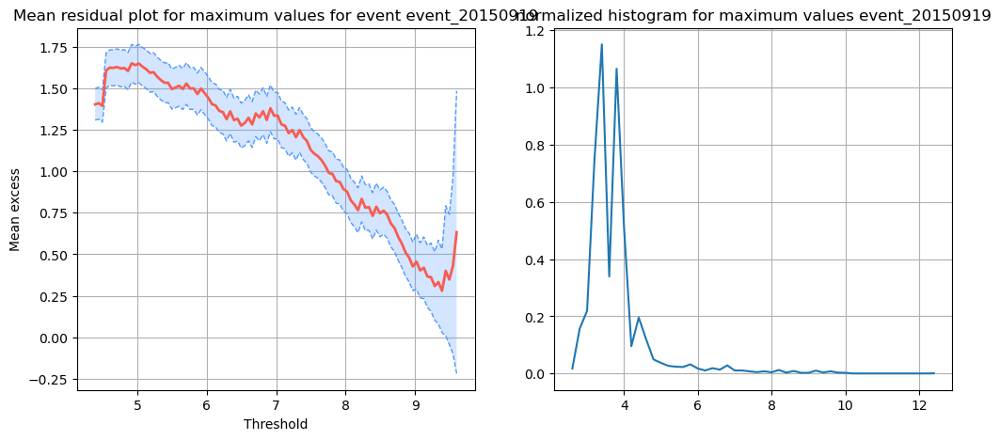

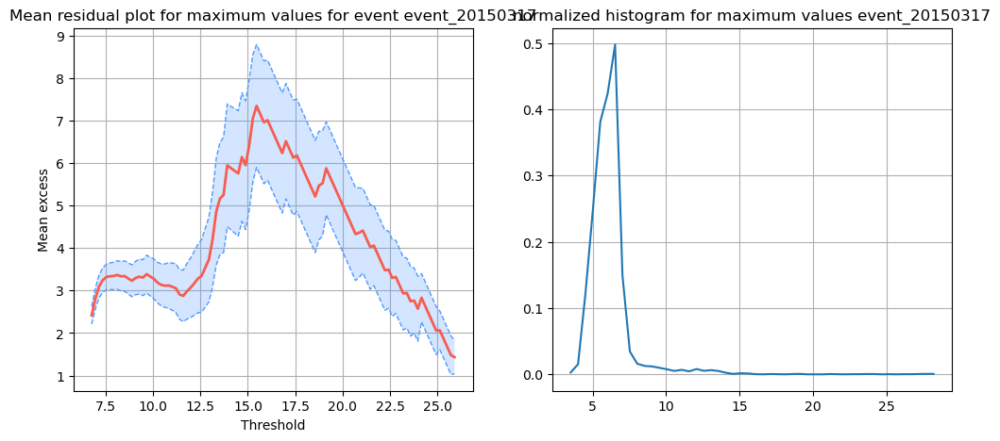

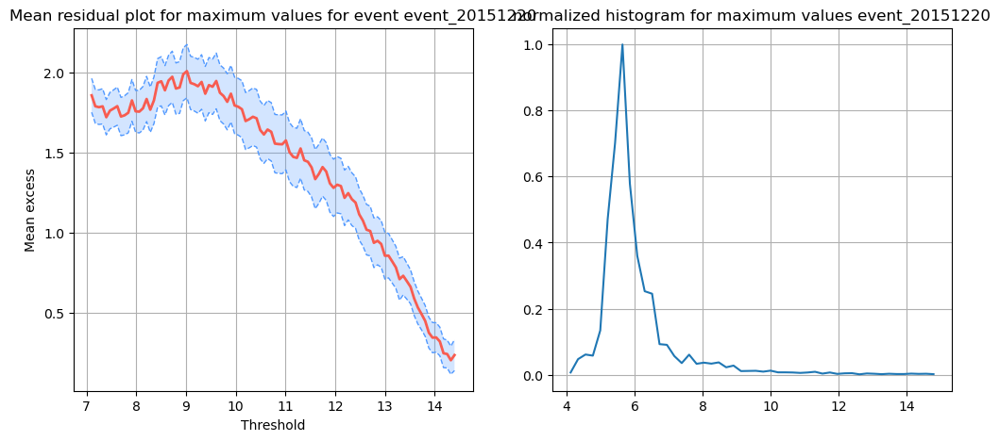

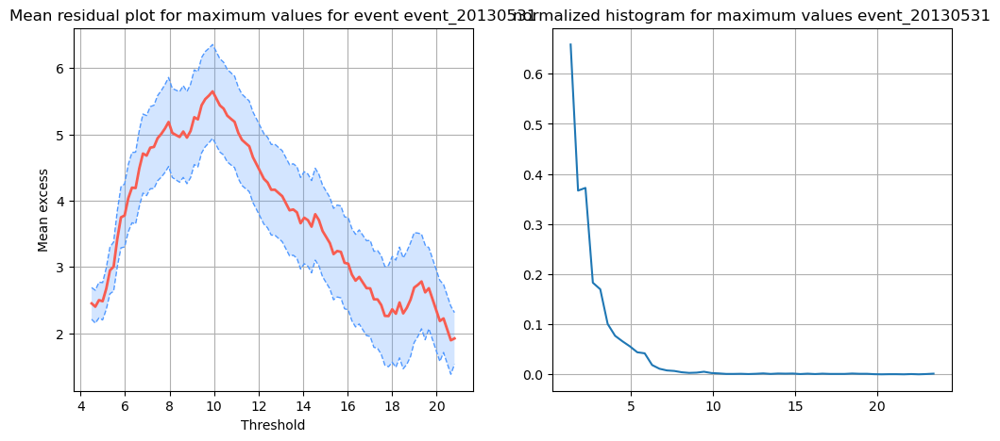

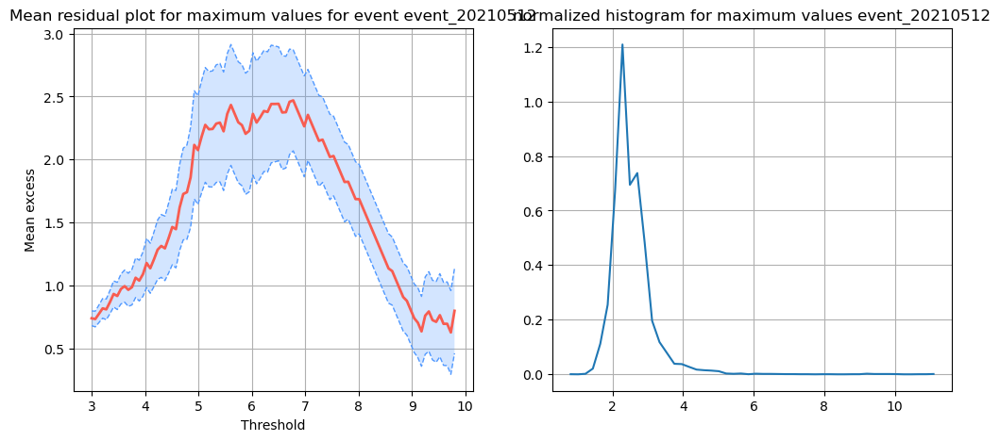

...

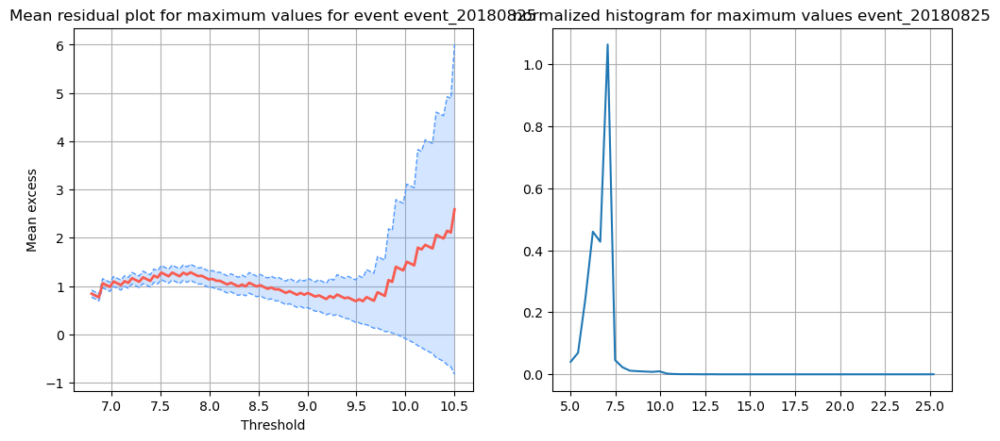

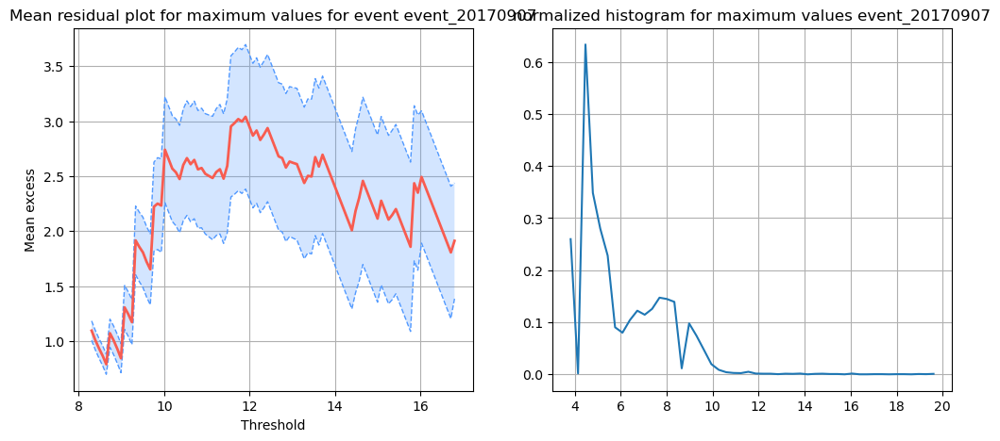

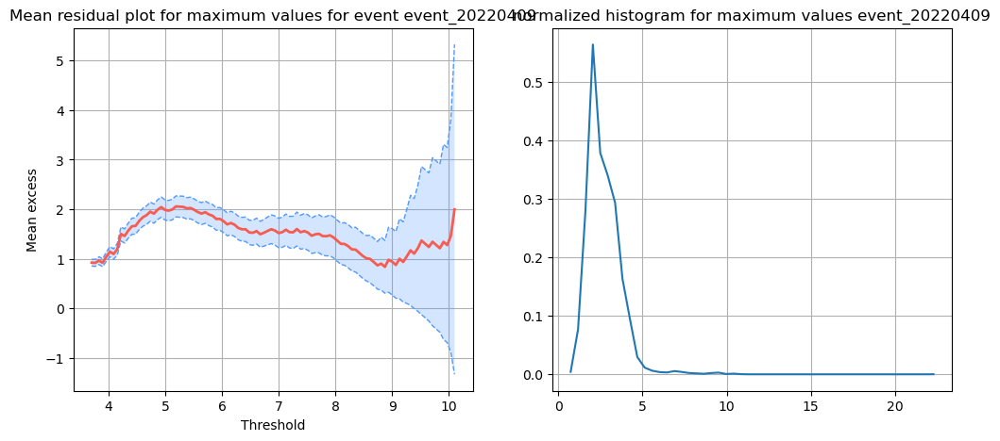

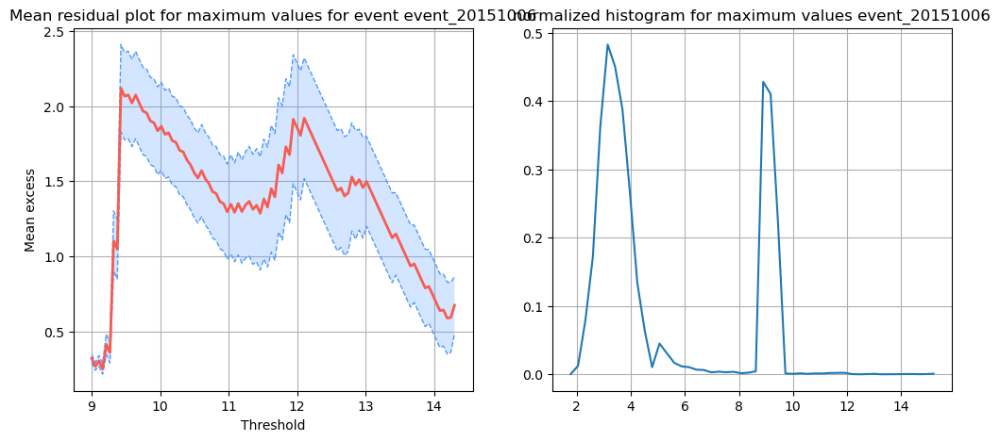

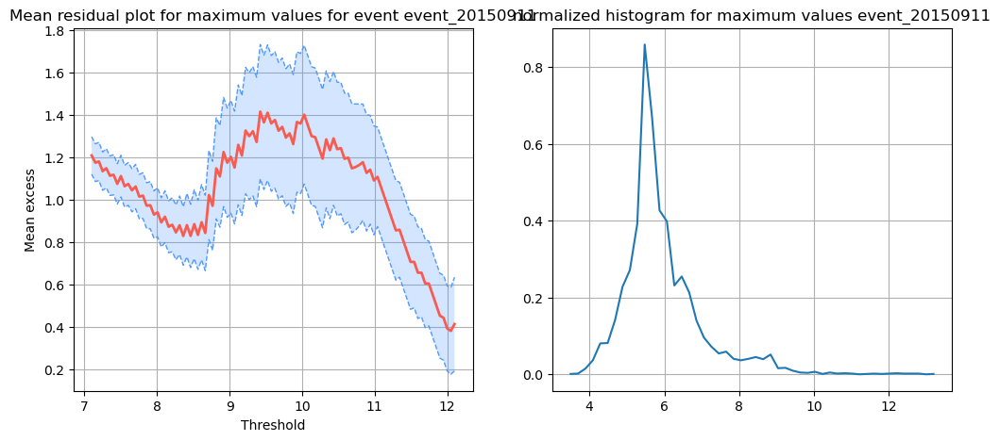

In [13]:
# Read in an concatenate the maximum values for all events
integrated_data_directory = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/'
files = glob.glob( os.path.join(integrated_data_directory,'*.csv') )

df_max_values = pd.DataFrame(columns=['datetimes','max values'])
df_AE = pd.DataFrame(columns=['datetimes','AE index'])

for f in files:
    df_max_values_loop = pd.DataFrame(columns=['datetimes','max values'])
    df_AE_loop = pd.DataFrame(columns=['datetimes','AE index'])

    df = pd.read_csv(f,index_col=False)
    df = df.drop(columns='Unnamed: 0')
    
    # read in the lat-long values for the sensors in this event
    print('\n\n\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
    print('\t--->{}'.format(f))
    
    event_loop = f[97:-4]
    
    # Drop unwanted columns, but save IMF and AE index columns
#     df_SW = df(['datetimes','AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']).copy()
    cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
    df.columns.to_list()[cols_to_drop_loc:]
    df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)
    
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')
    df_sensor_locations = pd.read_csv(file_sensor_locations)
    
    # Calculate solar wind variables, starting by getting one minute values
    df_SW_oneminute = get_sw_one_minute(df['datetimes'].values[0],df['datetimes'].values[-1])
    
    # Clean the data
    df, cols_to_drop_final = clean_GIC_data(df,df_sensor_locations)
    
    # Calculate the maximum values
    max_values = df.max(axis=1)
    df_max_values_loop['datetimes'] = df['datetimes'].values
    df_max_values_loop['max values'] = max_values.values
    
    df_max_values = pd.concat([df_max_values, df_max_values_loop], axis=0)
    
    df_AE_loop['datetimes'] = df_SW_oneminute['datetimes'].values
    df_AE_loop['AE index'] = df_SW_oneminute['AE_INDEX'].values
    
    df_AE = pd.concat([df_AE, df_AE_loop], axis=0)
    
    # plot the mean excess plot for each event
    fig = plt.figure(figsize=(12,5))
    gs = gridspec.GridSpec(1, 2, figure=fig)

    ax1 = plt.subplot(gs[0, 0])
    plot_mean_residual_life(max_values[~np.isnan(max_values)],ax=ax1)
    ax1.set_title('Mean residual plot for maximum values for event ' + event_loop)
    ax1.grid(True)

    ax2 = plt.subplot(gs[0, 1])
    counts, bin_edges = np.histogram(max_values[~np.isnan(max_values)], 
                                     bins=50,
                                     density=True)    
    plt.plot(bin_edges[1:],counts)    
    ax2.set_title('normalized histogram for maximum values ' + event_loop)
    ax2.grid(True)
#     plt.show()
    
    plt.savefig('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/figures/max_vals_event_'+event_loop)
    

In [15]:
df_max_values['datetimes'] = pd.to_datetime(df_max_values['datetimes'])
df_max_values.set_index('datetimes', inplace=True)

df_AE['datetimes'] = pd.to_datetime(df_AE['datetimes'])
df_AE.set_index('datetimes', inplace=True)

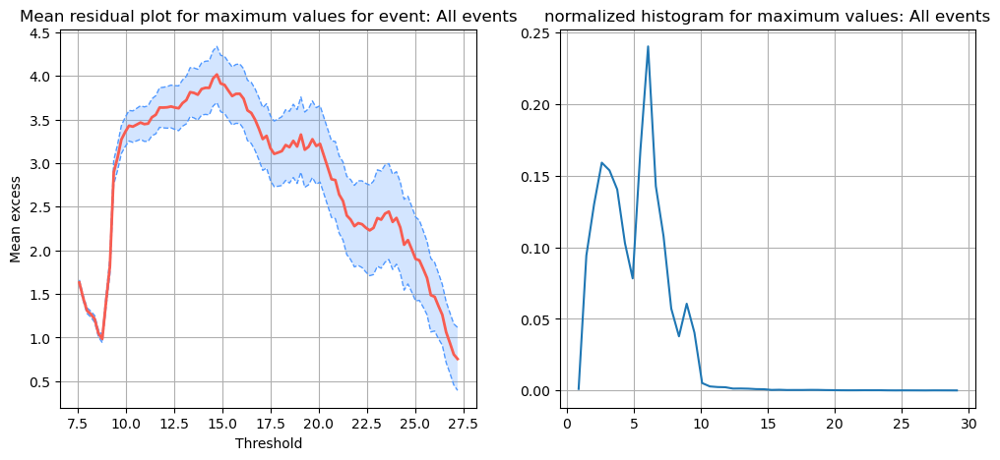

In [21]:
# plot the full mean excess plot for all events, using maximum value for a given time step
fig = plt.figure(figsize=(12,5))
gs = gridspec.GridSpec(1, 2, figure=fig)

ax1 = plt.subplot(gs[0, 0])
plot_mean_residual_life(df_max_values['max values'][~np.isnan(df_max_values['max values'].values)],ax=ax1)
ax1.set_title('Mean residual plot for maximum values for event: All events')
ax1.grid(True)

ax2 = plt.subplot(gs[0, 1])
counts, bin_edges = np.histogram(df_max_values['max values'][~np.isnan(df_max_values['max values'].values)].values, 
                                 bins=50,
                                 density=True)    
plt.plot(bin_edges[1:],counts)    
ax2.set_title('normalized histogram for maximum values: All events')
ax2.grid(True)
plt.show()

In [ ]:

import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.subplots import make_subplots


fig = make_subplots(rows=2, cols=1,shared_xaxes=True,)

fig.add_trace(go.Scatter(
                    x=df_AE.index,
                    y=df_AE['AE index'].values,
                    mode='markers',
                    name='AE Index'
                  ), 
              row=1, col=1)
,

fig.add_trace(go.Scatter(
                    x=df_max_values.index,
                    y=df_max_values,
                    mode='markers',
                    name='Max GIC'
                  ), 
              row=2, col=1)

fig.update_xaxes(range=[df_max_values.index[0], df_max_values.index[-1]])
fig.show()

In [181]:
df_max_values


,max values,max_values
datetimes,,
2015-09-19 00:00:00,NaN,NaN
2015-09-19 00:00:10,NaN,NaN
2015-09-19 00:00:20,NaN,NaN
2015-09-19 00:00:30,NaN,NaN
2015-09-19 00:00:40,NaN,NaN
...,...,...
2015-09-12 23:59:20,NaN,NaN
2015-09-12 23:59:30,NaN,NaN
2015-09-12 23:59:40,NaN,NaN


In [6]:
# Create a list of the unique GIC sensor IDs across all events
integrated_data_directory = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/'
files = glob.glob( os.path.join(integrated_data_directory,'*.csv') )

sensor_IDs_all = []

for f in files:
    df = pd.read_csv(f,index_col=False)
    df = df.drop(columns='Unnamed: 0')
    
    
    # read in the lat-long values for the sensors in this event
    print('\n\n\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
    print('\t--->{}'.format(f))
    
    
    # Drop unwanted columns, but save IMF and AE index columns
    cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
    df.columns.to_list()[cols_to_drop_loc:]
    df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)
    
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')
    df_sensor_locations = pd.read_csv(file_sensor_locations)
    
    # Clean the data
    df, cols_to_drop_final = clean_GIC_data(df,df_sensor_locations)
    
    df = df.drop(['datetimes'],axis=1)
    
    # Append to the running list of sensor IDs
    sensor_IDs_all += df.columns.to_list()
    






----------------------------
working on event: event_20150919
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150919.csv




----------------------------
working on event: event_20150317
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20150317.csv




----------------------------
working on event: event_20151220
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20151220.csv




----------------------------
working on event: event_20130531
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20130531.csv




----------------------------
working on event: event_20210512
	--->/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/integrated_data_event_20210512.csv




----------------------------
working on event: event_20131002

In [7]:
sensor_IDs_all_ints = [int(x) for x in sensor_IDs_all]
print(len(sensor_IDs_all_ints))
sensor_IDs_all_ints = np.unique(sensor_IDs_all_ints)
print(len(sensor_IDs_all_ints))

539
92


In [9]:
# Loop through the sensor IDs and create a dataframe for each with all GIC values across events


integrated_data_directory = '/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/integrated_data/'
files = glob.glob( os.path.join(integrated_data_directory,'*.csv') )


for s in sensor_IDs_all_ints[2:]:
    print('\n\n\t\t PROGRESS = {} \n\n'.format((np.where(sensor_IDs_all_ints == s)[0][0] / len(sensor_IDs_all_ints))*100))
    print('\n\n----------------------------\nworking on sensor ID = {}'.format( s ))
    
    # create the dataframe 
    df_s = pd.DataFrame(columns=['datetimes',str(s)])
    

    for f in files:

        df = pd.read_csv(f,index_col=False)
        df = df.drop(columns='Unnamed: 0')

        event_loop = f[97:-4]

        # Drop unwanted columns, but save IMF and AE index columns
    #     df_SW = df(['datetimes','AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']).copy()
        cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
        df.columns.to_list()[cols_to_drop_loc:]
        df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)

        file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')
        df_sensor_locations = pd.read_csv(file_sensor_locations)

        # Clean the data
        df, cols_to_drop_final = clean_GIC_data(df,df_sensor_locations)
        
        if str(s) in df.columns:
            columns_to_keep = ['datetimes',str(s)]

            # Drop all columns except those in columns_to_keep
            df = df[columns_to_keep]
            
            df_s = pd.concat([df_s, df], axis=0)

    df_s.to_csv('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/figures/sensor_IDs_EVA/df_'+str(s)+'.csv',index=False)
    
#     # plot the mean excess plot for each event
#     fig = plt.figure(figsize=(12,5))
#     gs = gridspec.GridSpec(1, 2, figure=fig)

#     ax1 = plt.subplot(gs[0, 0])
#     plot_mean_residual_life(df_s[str(s)][~np.isnan(df_s[str(s)])],ax=ax1)
#     ax1.set_title('Mean residual plot for maximum values \nfor sensor ID = {} ' + str(s))
#     ax1.grid(True)

#     ax2 = plt.subplot(gs[0, 1])
#     counts, bin_edges = np.histogram(df_s[str(s)].values[~np.isnan(df_s[str(s)].values)], 
#                                      bins=50,
#                                      density=True)    
#     plt.plot(bin_edges[1:],counts)    
#     ax2.set_title('normalized histogram \nfor sensor ID = {} ' + str(s))
#     ax2.grid(True)
# #     plt.show()
    
#     plt.savefig('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/figures/sensor_IDs_EVA/mean_residual_'+str(s))
    




		 PROGRESS = 2.1739130434782608 




----------------------------
working on sensor ID = 10066


		 PROGRESS = 3.260869565217391 




----------------------------
working on sensor ID = 10071


		 PROGRESS = 4.3478260869565215 




----------------------------
working on sensor ID = 10074


		 PROGRESS = 5.434782608695652 




----------------------------
working on sensor ID = 10075


		 PROGRESS = 6.521739130434782 




----------------------------
working on sensor ID = 10076


		 PROGRESS = 7.608695652173914 




----------------------------
working on sensor ID = 10077


		 PROGRESS = 8.695652173913043 




----------------------------
working on sensor ID = 10078


		 PROGRESS = 9.782608695652174 




----------------------------
working on sensor ID = 10079


		 PROGRESS = 10.869565217391305 




----------------------------
working on sensor ID = 10080


		 PROGRESS = 11.956521739130435 




----------------------------
working on sensor ID = 10085


		 PROGRESS = 13.0434782



		 PROGRESS = 94.56521739130434 




----------------------------
working on sensor ID = 10404


		 PROGRESS = 95.65217391304348 




----------------------------
working on sensor ID = 10409


		 PROGRESS = 96.73913043478261 




----------------------------
working on sensor ID = 10421


		 PROGRESS = 97.82608695652173 




----------------------------
working on sensor ID = 10423


		 PROGRESS = 98.91304347826086 




----------------------------
working on sensor ID = 10440


### Hills Estimator

### Peaks over Threshold

In [5]:
import plotly.express as px


In [6]:
sensor_ID = '10397'


df_s = pd.read_csv('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/figures/sensor_IDs_EVA/df_'+str(sensor_ID)+'.csv')
df_s['datetimes'] = pd.to_datetime(df_s['datetimes'])
df_s.set_index('datetimes', inplace=True)



    # 10397
data = {'Lat': [39.10],  # get from ERO portal
        'Lon': [-78.30]}  # get from ERO portal (given in degrees W)


df_locale = pd.DataFrame(data)

fig = px.scatter_geo(df_locale, lat='Lat', lon='Lon', scope='usa')
fig.update_traces(marker=dict(size=10))  # Adjust the size as needed
fig.show()



/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/pyextremes/eva.py:121: RuntimeWarning:

`data` index is not sorted in ascending order - sorting `data` by index

/Users/ryanmc/opt/anaconda3/envs/spwxr_network/lib/python3.9/site-packages/pyextremes/eva.py:131: RuntimeWarning:

183,600 Null values found in `data` - removing invalid entries



<IPython.core.display.Javascript object>


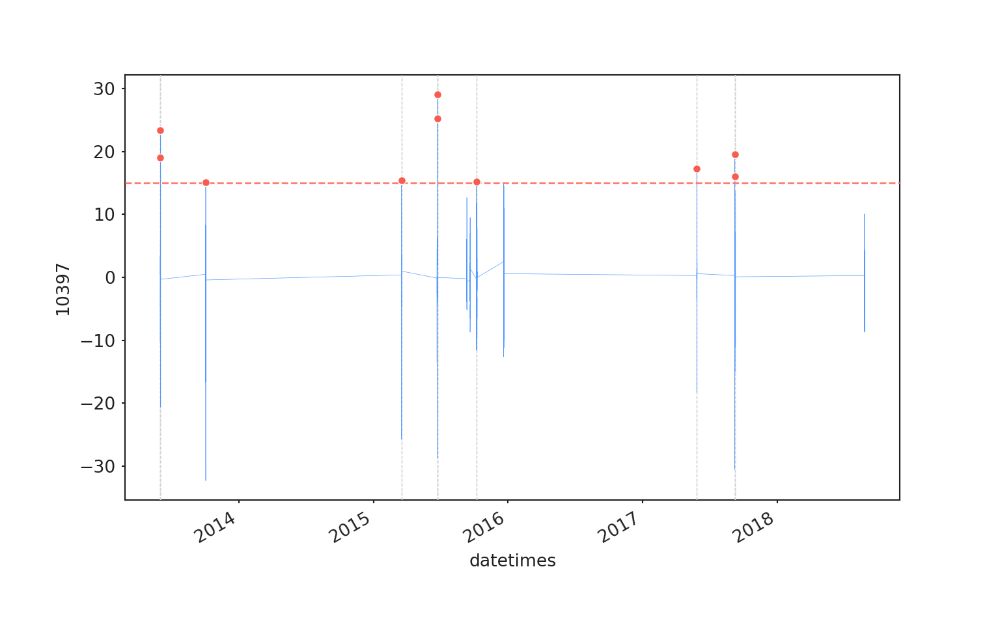

(<Figure size 768x480 with 1 Axes>, <Axes: xlabel='datetimes', ylabel='10397'>)

In [8]:
%matplotlib notebook
model = EVA(data=df_s[sensor_ID])
model.get_extremes("POT", threshold=15., r="1H")
model.plot_extremes(show_clusters=True)


In [14]:
model.plot_diagnostic()

### Regional mean residual life analyses

In [5]:
def is_point_in_bin(lat, lon, bin_lat_min, bin_lat_max, bin_lon_min, bin_lon_max):
    """
    Check if a latitude and longitude point falls within a specified bin.

    Parameters:
    - lat: Latitude of the point.
    - lon: Longitude of the point.
    - bin_lat_min: Minimum latitude of the bin.
    - bin_lat_max: Maximum latitude of the bin.
    - bin_lon_min: Minimum longitude of the bin.
    - bin_lon_max: Maximum longitude of the bin.

    Returns:
    - True if the point is within the bin, False otherwise.
    """
    return bin_lat_min <= lat <= bin_lat_max and bin_lon_min <= lon <= bin_lon_max


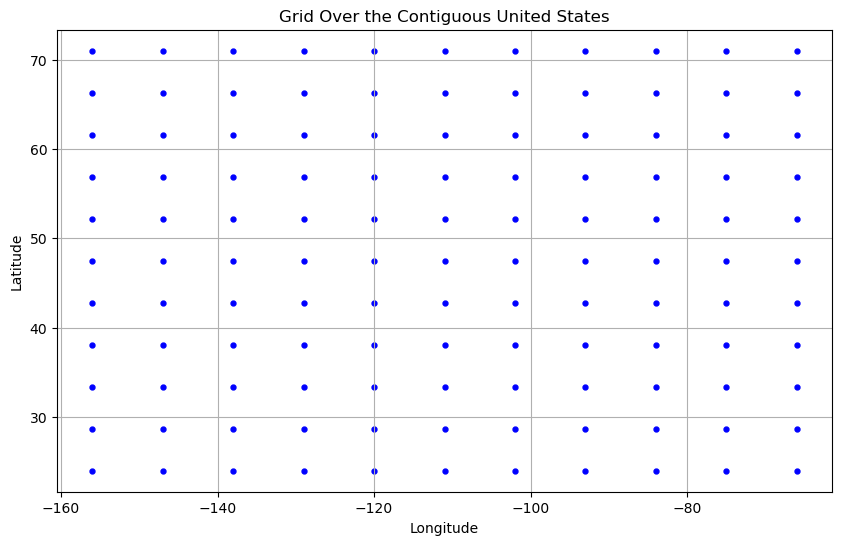

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Define the bounding box for the contiguous United States
min_lat, max_lat = 24, 71  # Latitude range
min_lon, max_lon = -179, -66  # Longitude range

# Define the number of latitude and longitude divisions for the grid
num_lat_divisions = 10
num_lon_divisions = 10

# Calculate latitude and longitude step sizes
lat_step = (max_lat - min_lat) / num_lat_divisions
lon_step = (max_lon - min_lon) / num_lon_divisions

# Create arrays of latitude and longitude values for the grid
latitudes = np.linspace(min_lat, max_lat, num_lat_divisions + 1)
longitudes = np.linspace(min_lon, max_lon, num_lon_divisions + 1)

# Create a mesh grid from latitude and longitude values
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Plot the grid
plt.figure(figsize=(10, 6))
plt.scatter(lon_grid, lat_grid, c='blue', marker='.', s=50)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Grid Over the Contiguous United States')
plt.grid(True)

plt.show()


In [6]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

In [32]:
# df_drop_tmp
df_sensor_locations['Device ID']

0      10075
1      10076
2      10222
3      10224
4      10254
       ...  
108    10434
109    10435
110    10436
111    10477
112    10540
Name: Device ID, Length: 113, dtype: int64

In [33]:
df_drop_tmp = ['10075','10000','10434'] #replace this variable with the df_drop_final
df_drop_tmp = [int(chc) for chc in df_drop_tmp]
df_drop_sensor_locations = intersection(df_drop_tmp,df_sensor_locations['Device ID'].values)

df_sensor_locations[~df_sensor_locations['Device ID'].isin(df_drop_tmp)]


[10075, 10434]

In [28]:
# Choose event
print('event we are working with is: {}'.format(files[1:2][0][-12:-4]))


for f in files[1:2]:
    df = pd.read_csv(f,index_col=False)
    df = df.drop(columns='Unnamed: 0')
    
    # read in the lat-long values for the sensors in this event
    print('\n\n----------------------------\nworking on event: {}'.format(f[97:-4])) #f.find('event')
#     print('\t--->{}'.format(f))
    file_sensor_locations = os.path.join('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/','risk-resiliency-spwx','data',f[97:-4],'GIC','gic_monitors.csv')

#     print('\t--->{}'.format(file_sensor_locations))
    df_sensor_locations = pd.read_csv(file_sensor_locations)
    
    # Drop unwanted columns, but save IMF and AE index columns
#     df_SW = df(['datetimes','AE_INDEX','BX_GSE','BY_GSM','BZ_GSM']).copy()
    cols_to_drop_loc = df.columns.get_loc('AE_INDEX')
    df.columns.to_list()[cols_to_drop_loc:]
    df = df.drop(df.columns.to_list()[cols_to_drop_loc:],axis = 1)
    
    
    # Clean the data
    df, cols_to_drop_final = clean_GIC_data(df,df_sensor_locations)
    df = df.set_index(['datetimes'])
    df.index = pd.to_datetime(df.index)
    
    # drop the sensor locations that are in cols_to_drop_final
    df_drop_sensor_locations = [int(d) for d in df.columns.to_list()]

    df_sensor_locations = df_sensor_locations[df_sensor_locations['Device ID'].isin(df_drop_sensor_locations)]

    
    # Get the SW data
    df_SW_oneminute = get_sw_one_minute(df.index.values[0],df.index.values[-1])

    


event we are working with is: 20150317


----------------------------
working on event: event_20150317


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

['/Users/ryanmc/sunpy/data/omni_hro2_1min_20150301_v01.cdf']


Index(['AE_INDEX', 'BX_GSE', 'BY_GSM', 'BZ_GSM'], dtype='object')



Bin 0-0:
Latitude Range: 24.0 to 28.7
Longitude Range: -179.0 to -167.7
NO sensors in this bin

Bin 0-1:
Latitude Range: 24.0 to 28.7
Longitude Range: -167.7 to -156.4
NO sensors in this bin

Bin 0-2:
Latitude Range: 24.0 to 28.7
Longitude Range: -156.4 to -145.1
NO sensors in this bin

Bin 0-3:
Latitude Range: 24.0 to 28.7
Longitude Range: -145.1 to -133.8
NO sensors in this bin

Bin 0-4:
Latitude Range: 24.0 to 28.7
Longitude Range: -133.8 to -122.5
NO sensors in this bin

Bin 0-5:
Latitude Range: 24.0 to 28.7
Longitude Range: -122.5 to -111.19999999999999
NO sensors in this bin

Bin 0-6:
Latitude Range: 24.0 to 28.7
Longitude Range: -111.19999999999999 to -99.89999999999999
NO sensors in this bin

Bin 0-7:
Latitude Range: 24.0 to 28.7
Longitude Range: -99.89999999999999 to -88.6
NO sensors in this bin

Bin 0-8:
Latitude Range: 24.0 to 28.7
Longitude Range: -88.6 to -77.3
NO sensors in this bin

Bin 0-9:
Latitude Range: 24.0 to 28.7
Longitude Range: -77.3 to -66.0
NO sensors in this

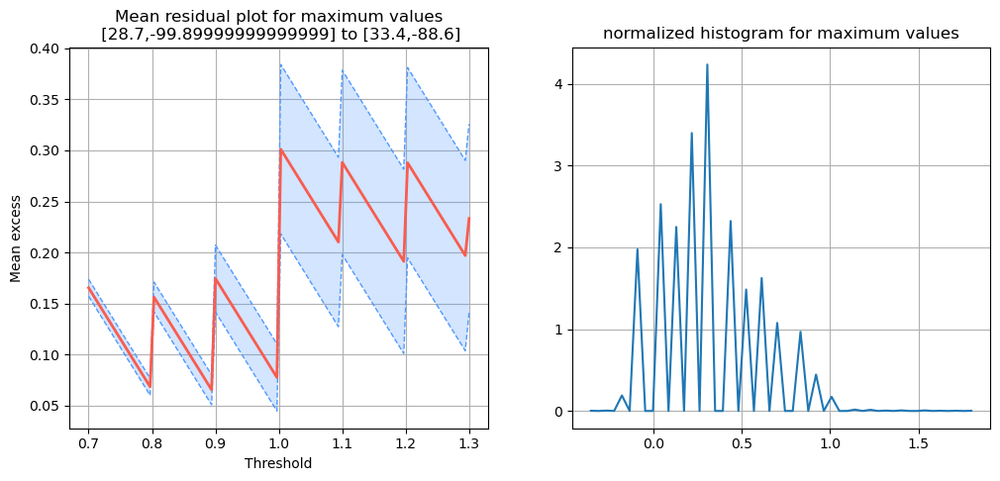

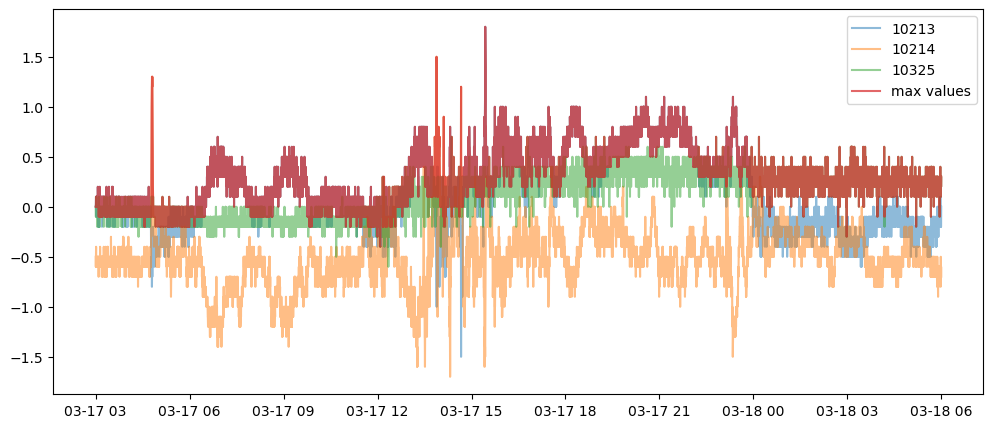

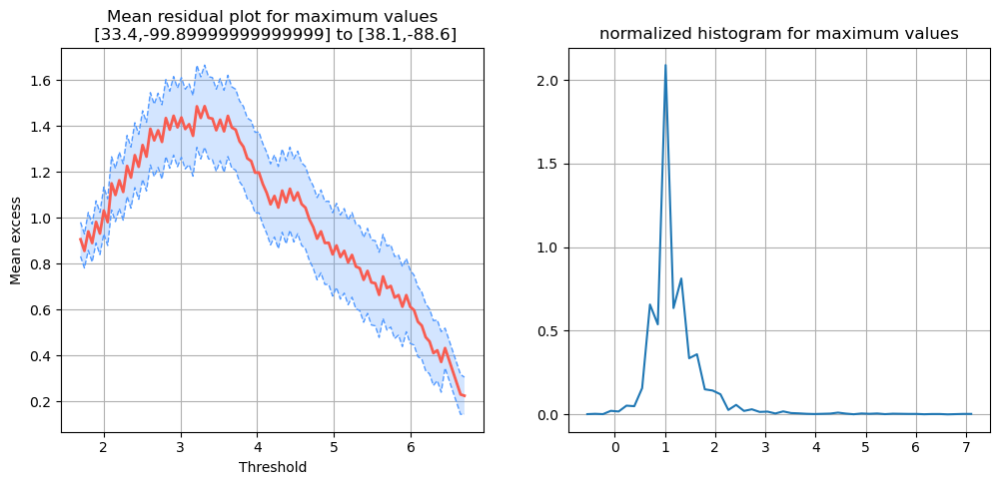

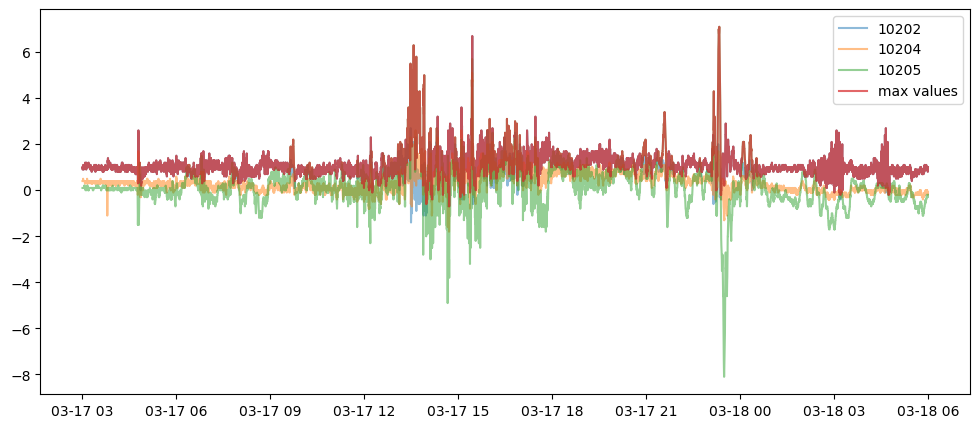

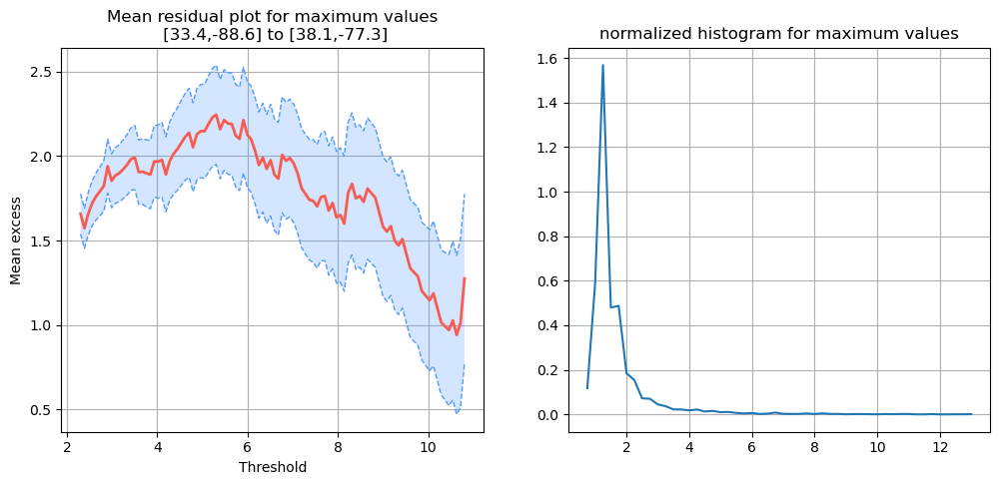

...

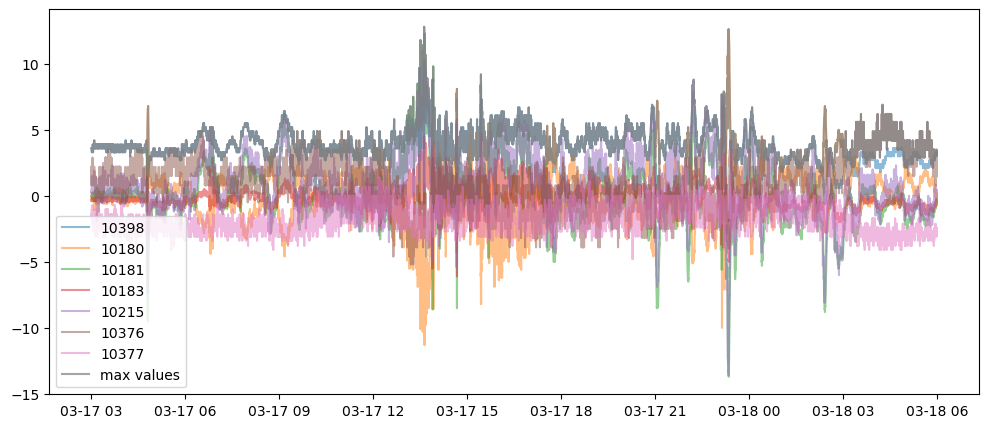

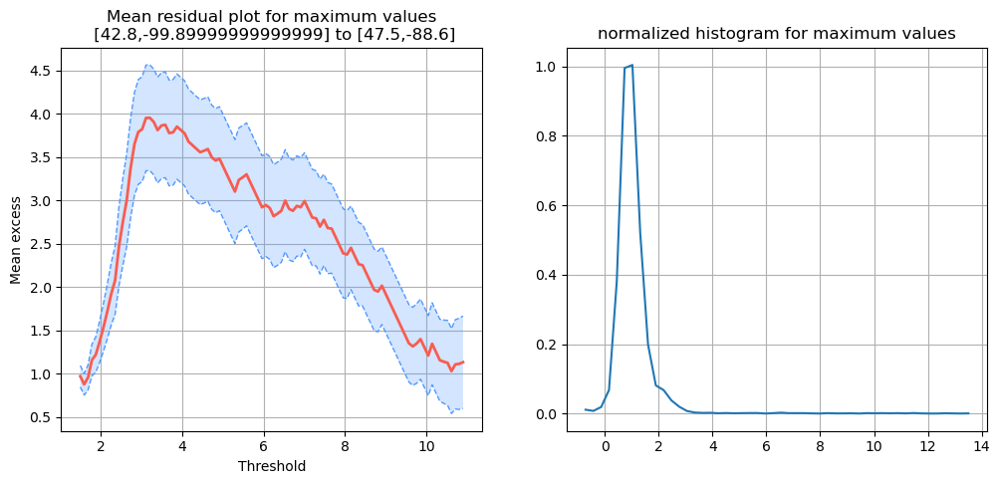

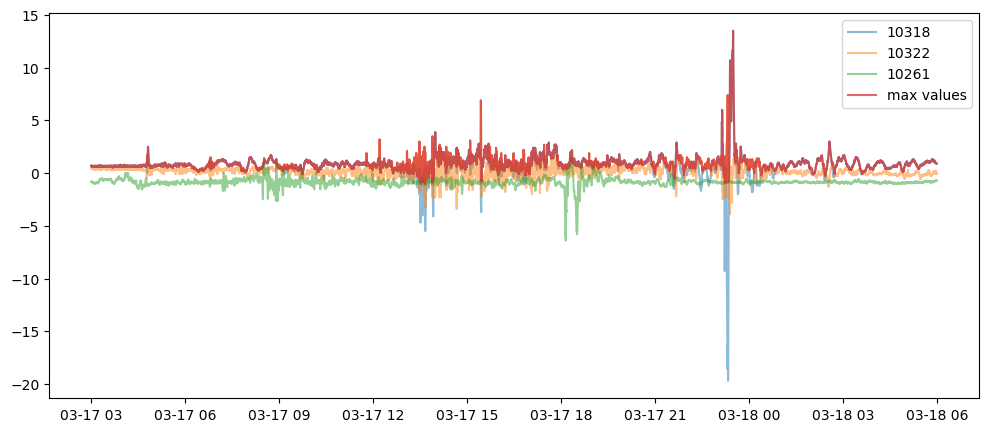

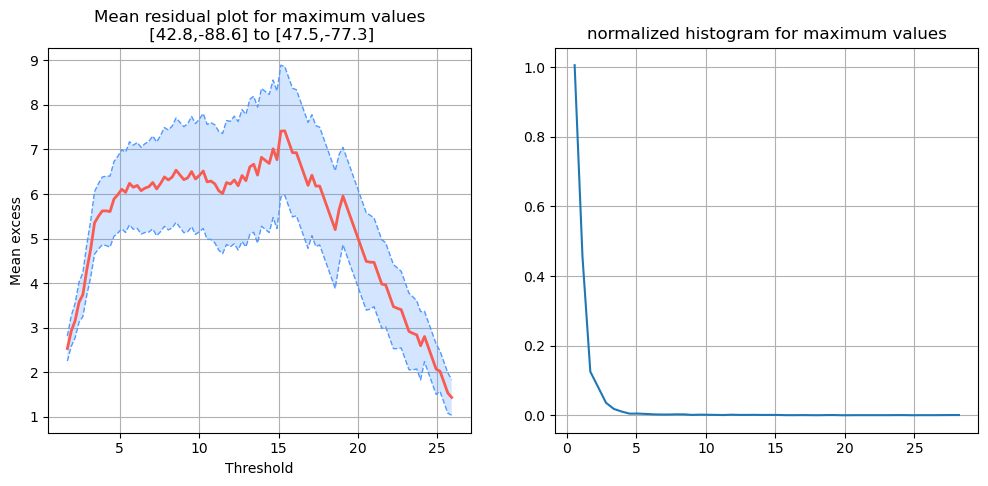

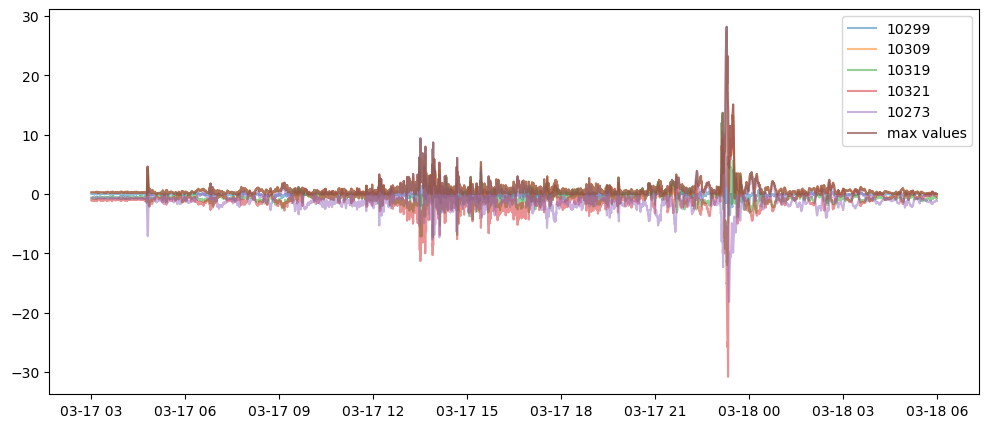

In [29]:

# Define the latitude and longitude limits for the contiguous United States, including Alaska
min_lat, max_lat = 24, 71  # Latitude range
min_lon, max_lon = -179, -66  # Longitude range

# Define the number of latitude and longitude divisions for the grid
num_lat_divisions = 10
num_lon_divisions = 10

# Calculate latitude and longitude step sizes
lat_step = (max_lat - min_lat) / num_lat_divisions
lon_step = (max_lon - min_lon) / num_lon_divisions

# Initialize lists to store bin boundaries
latitudes = []
longitudes = []

# Create latitude and longitude arrays for bin boundaries
for i in range(num_lat_divisions + 1):
    lat = min_lat + i * lat_step
    latitudes.append(lat)

for i in range(num_lon_divisions + 1):
    lon = min_lon + i * lon_step
    longitudes.append(lon)

# Print the grid boundaries
for i in range(num_lat_divisions):
    for j in range(num_lon_divisions):
        # Calculate bin boundaries for each grid cell
        bin_lat_min = latitudes[i]
        bin_lat_max = latitudes[i + 1]
        bin_lon_min = longitudes[j]
        bin_lon_max = longitudes[j + 1]

        # Print bin boundaries for each cell
        print()
        print(f"Bin {i}-{j}:")
        print(f"Latitude Range: {bin_lat_min} to {bin_lat_max}")
        print(f"Longitude Range: {bin_lon_min} to {bin_lon_max}")
        
        # Get sensors in this bin
        sensors_to_keep_bin = []
        for l in range(len(df_sensor_locations)):
            lat_sensor_tmp = df_sensor_locations[' Latitude'].values[l]
            lon_sensor_tmp = (df_sensor_locations[' Longitude'].values[l])*-1.
            if ((  bin_lat_min < lat_sensor_tmp < bin_lat_max ) and
                ( bin_lon_min < lon_sensor_tmp < bin_lon_max )):
                    sensors_to_keep_bin.append(df_sensor_locations['Device ID'].values[l])
                    
        if (not sensors_to_keep_bin) | (len(sensors_to_keep_bin) < 2):
            print('NO sensors in this bin')
            continue
        else:
            print('sensors in this bin = {}'.format(sensors_to_keep_bin))
            
            
            # Create dataframe for those sensors in the bin
            sensors_to_keep_bin_strs = [str(stkb) for stkb in sensors_to_keep_bin]
            df_bin = df[sensors_to_keep_bin_strs]
            df_sensors_bin = df_sensor_locations[df_sensor_locations['Device ID'].isin(sensors_to_keep_bin)]

            

            # Create a map centered around the United States
#             us_map = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
#             for point in range(len(df_sensors_bin)):
#                 folium.Marker(location=[df_sensors_bin[' Latitude'].values[point],df_sensors_bin[' Longitude'].values[point]*-1. ], 
#                               popup=df_sensors_bin['Device ID'].values[point],
#                               icon=folium.Icon(color='red', icon='home', prefix='fa')).add_to(us_map)

#             folium.Marker(location=[bin_lat_min,bin_lon_min]).add_to(us_map)
#             folium.Marker(location=[bin_lat_max,bin_lon_min]).add_to(us_map)
#             folium.Marker(location=[bin_lat_max,bin_lon_max]).add_to(us_map)
#             folium.Marker(location=[bin_lat_min,bin_lon_max]).add_to(us_map)
#             display(us_map)
            
            fig = px.scatter_geo(
                locationmode="USA-states",
                scope="usa",
                title="Scatter Geo Plot with Different Colors",
            )


            df_locale = pd.DataFrame(df_sensors_bin[[' Latitude',' Longitude','Device ID']])
            df_locale[' Longitude'] = df_locale[' Longitude']*-1.
            # Add points from df1 with a custom color
            fig.add_trace(
                px.scatter_geo(
                    df_locale,
                    lat=" Latitude",
                    lon=" Longitude",
                    text="Device ID",
                    color_discrete_sequence=["blue"],  # Specify color for df1
                ).data[0]
            )


            df_plot_bin = pd.DataFrame(columns=['Latitude','Longitude'])
            df_plot_bin['Latitude'] = np.array( (bin_lat_min,bin_lat_max,bin_lat_max,bin_lat_min) )
            df_plot_bin['Longitude'] = np.array( (bin_lon_min,bin_lon_min,bin_lon_max,bin_lon_max) )
            # Add points from df2 with a different custom color
            fig.add_trace(
                px.scatter_geo(
                    df_plot_bin,
                    lat="Latitude",
                    lon="Longitude",
                    color_discrete_sequence=["red"],  # Specify color for df2
                ).data[0]
            )
#             # Show the combined plot
# #             fig.show()
#             fig.write_image('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/figures/regional_EVA/'+f[97:-4]+'/bin['+str(bin_lat_min)+','+str(bin_lon_min)+'] to ['+str(bin_lat_max)+','+str(bin_lon_max)+']_locations.png')

            

            
            # Calculate the maximum observation at each time step
            max_values = df_bin.max(axis=1)
            
            fig = plt.figure(figsize=(12,5))
            gs = gridspec.GridSpec(1, 2, figure=fig)

            ax1 = plt.subplot(gs[0, 0])
            plot_mean_residual_life(max_values[~np.isnan(max_values)],ax=ax1)
            ax1.set_title('Mean residual plot for maximum values\n ['+str(bin_lat_min)+','+str(bin_lon_min)+'] to ['+str(bin_lat_max)+','+str(bin_lon_max)+']')
            ax1.grid(True)

            ax2 = plt.subplot(gs[0, 1])
            counts, bin_edges = np.histogram(max_values[~np.isnan(max_values)], 
                                             bins=50,
                                             density=True)    
            plt.plot(bin_edges[1:],counts)    
            ax2.set_title('normalized histogram for maximum values')
            ax2.grid(True)

#             input("Press Enter to continue...") 
            

#             # Save figures
#             plt.savefig('/Users/ryanmc/Documents/Conferences/Jack_Eddy_Symposium_2022/dev/figures/regional_EVA/'+f[97:-4]+'/bin['+str(bin_lat_min)+','+str(bin_lon_min)+'] to ['+str(bin_lat_max)+','+str(bin_lon_max)+']_mean_residual.png')

            
            # Create a plot of the time series of each sensor and the time series of the maximum values across them to assess IID assumption
            fig = plt.figure(figsize=(12,5))
            gs = gridspec.GridSpec(1, 1, figure=fig)
            ax1 = plt.subplot(gs[0, 0])
            for col in df_bin.columns.to_list():
                plt.plot(df.index,df[col],label=col,alpha=0.5)
            plt.plot(df.index,max_values,label='max values',alpha=0.7)
            plt.legend()

        
        

# Plot the grid or perform other operations as needed


In [27]:
sensors_to_keep_bin

[10213, 10214, 10324, 10325, 10326, 10477]